# Stage-Two Filamentary Coil Optimization
This notebook will show how to use DESC to perform stage two coil optimization with filamentary coils of differing parameterizations, such as Fourier in terms of arbitrary angle (as pioneered by [FOCUS][1]) or planar coils described in terms of the coil center, normal to the plane, and a Fourier series describing the radius of the coil in that plane. We will first find a coilset for the precise QA ([Landreman & Paul 2022][2]) vacuum equilibrium, starting from an initial coilset composed of circular planar coils, with only coils parameterized by a Fourier series in an arbitrary curve parameter. A second coil optimization will be performed for a W7-X-like finite beta equilibrium using a coilset composed of various coil parameterizations. Once optimized, the normal field error will be assessed, and for the vacuum equilibrium, field line tracing will be performed to compare the Poincare trace to the equilibrium flux surfaces.


[1]: <https://doi.org/10.1088/1741-4326/aa8e0a> "Zhu, C., Hudson, S. R., Song, Y. & Wan, Y. New method to design stellarator coils without the winding surface. Nucl. Fusion 58, 016008 (2018)."

[2]: <https://journals.aps.org/prl/abstract/10.1103/PhysRevLett.128.035001> "M. Landreman. & E. Paul. 2022 Physical Review Letters"

In [1]:
# uncomment these two lines if using a gpu for a speedup
# from desc import set_device
# set_device("gpu")

In [2]:

import numpy as np
from desc.coils import CoilSet, FourierPlanarCoil
import desc.examples
from desc.equilibrium import Equilibrium
from desc.plotting import plot_surfaces, plot_2d, plot_3d, plot_coils
from desc.grid import LinearGrid
from desc.coils import MixedCoilSet
from desc.objectives import (
    ObjectiveFunction,
    CoilCurvature,
    CoilLength,
    CoilTorsion,
    CoilSetMinDistance,
    PlasmaCoilSetMinDistance,
    QuadraticFlux,
    ToroidalFlux,
    FixCoilCurrent,
    FixParameters,
)
from desc.optimize import Optimizer
from desc.magnetic_fields import field_line_integrate
from desc.singularities import compute_B_plasma
import time

DESC version 0.11.1+1053.g393e24bbc.dirty,using JAX backend, jax version=0.4.30, jaxlib version=0.4.30, dtype=float64
Using device: CPU, with 3.73 GB available memory


## Coil Optimization Metrics

Two main figures of merit regarding the quality of the coil optimization in recreating the equilibrium are the average normalized magnetic field and Poincare plot from the coils. The average normalized magnetic field is a measure of how well the coils' field (plus the plasma field if it is finite beta) recreates last closed flux surface of the target equilibrium and is given as 
$$
\frac{\left<|\mathbf{B}_{\text{total}}\cdot \mathbf{\hat{n}}|\right>}{\left<|\mathbf{B}_{total}|\right>}
$$
where $\mathbf{\hat{n}}$ is the normal vector to the equilibrium's last closed flux surface and $\mathbf{B}_{\text{total}} = \mathbf{B}_{\text{coils}} + \mathbf{B}_{\text{plasma currents}}$. Field traces are also significant for vacuum equilibria because they visually show the quality of the coil field in recreating the equilibrium vacuum flux surfaces.

These two metrics are calculated in functions below.

In [3]:
def compute_average_normalized_field(field, eq):
    grid = LinearGrid(M=80, N=80, NFP=eq.NFP)
    Bn, surf_coords = field.compute_Bnormal(eq, eval_grid=grid)
    normalizing_field_vec = field.compute_magnetic_field(surf_coords)
    if isinstance(eq,Equilibrium):
        # add plasma field to the normalizing field
        normalizing_field_vec += compute_B_plasma(eq, eval_grid=grid)
    normalizing_field = np.mean(np.linalg.norm(normalizing_field_vec, axis=1))
    return np.mean(np.abs(Bn)) / normalizing_field


def plot_field_lines(field, eq):
    # for starting locations we'll pick positions on flux surfaces on the outboard midplane
    grid_trace = LinearGrid(rho=np.linspace(0, 1, 9))
    r0 = eq.compute("R", grid=grid_trace)["R"]
    z0 = eq.compute("Z", grid=grid_trace)["Z"]
    fig, ax = desc.plotting.plot_surfaces(eq)
    fig, ax = desc.plotting.poincare_plot(field, r0, z0, NFP=eq.NFP, ax=ax)
    return fig, ax

## Vacuum

We will be focusing on optimizing coils with the vacuum precise QA as the target equilibrium.

In [4]:
eq = desc.examples.get("precise_QA")

### Make initial coilset
we will initialize with circular coils centered on the equilibrium axis and with their normal oriented along the axis tangent vector.


In [5]:
minor_radius = eq.compute("a")["a"]
offset = 0.3
num_coils = 3  # coils per half field period

zeta = np.linspace(0, np.pi / eq.NFP, num_coils, endpoint=False) + np.pi / (
    2 * eq.NFP * num_coils
)
grid = LinearGrid(rho=[0.0], M=0, zeta=zeta, NFP=eq.NFP)
data_center = eq.axis.compute("x", grid=grid, basis="rpz")
data_normal = eq.axis.compute("x_s", grid=grid, basis="rpz")

centers = data_center["x"]
normals = data_normal["x_s"]

unique_coils = []
for k in range(num_coils):
    coil = FourierPlanarCoil(
        current=1e6,
        center=centers[k, :],
        normal=normals[k, :],
        r_n=[0, minor_radius + offset, 0],
        basis="rpz",  # we are giving the center and normal in cylindrical
    ).to_FourierXYZ(
        N=10
    )  # fit with 10 fourier coefficients per coil
    unique_coils.append(coil)

# We package these coils together into a CoilSet, which has efficient methods for calculating
# the total field while accounting for field period and stellarator symmetry
# Note that `CoilSet` requires all the member coils to have the same parameterization and resolution.
# if we wanted to use coils of different types or resolutions, we can use a `MixedCoilSet` (see the next section below)
coilset = CoilSet(unique_coils, NFP=int(eq.NFP), sym=eq.sym)

# visualize the initial coilset
plot_grid = LinearGrid(M=20,N=40,NFP=1,endpoint=True) # a smaller than usual plot grid to reduce memory of the notebok file
fig = plot_3d(eq, "|B|",grid=plot_grid)
fig = plot_coils(coilset, fig=fig)
fig.show()

### Optimizing a `FourierXYZCoil` coil set

In [6]:
# number of points used to discretize coils. This could be different for each objective
# (eg if you want higher resolution for some calculations), but we'll use the same for all of them
coil_grid = LinearGrid(N=50)
# similarly define a grid on the plasma surface where B*n errors will be evaluated
plasma_grid = LinearGrid(M=25, N=25, NFP=eq.NFP, sym=eq.sym)


# define our objective function
obj = ObjectiveFunction(
    (
        QuadraticFlux(
            eq,
            field=coilset,
            # grid of points on plasma surface to evaluate normal field error
            eval_grid=plasma_grid,
            field_grid=coil_grid,
            vacuum=True,  # vacuum=True means we won't calculate the plasma contribution to B as it is zero
            weight=100,
        ),
        CoilSetMinDistance(
            coilset,
            # in normalized units, want coil-coil distance to be at least 10% of minor radius
            bounds=(0.1, np.inf),
            grid=coil_grid,
            weight=100,
        ),
        PlasmaCoilSetMinDistance(
            eq,
            coilset,
            # in normalized units, want plasma-coil distance to be at least 25% of minor radius
            bounds=(0.25, np.inf),
            plasma_grid=plasma_grid,
            coil_grid=coil_grid,
            eq_fixed=True,  # Fix the equilibrium. For single stage optimization, this would be False
            weight=10,
        ),
        CoilCurvature(
            coilset,
            # in normalized units, curvature of ~=1 means circular, so we allow them to be a bit more strongly shaped
            bounds=(0, 2),
            grid=coil_grid,
            weight=1000,
        ),
        CoilLength(
            coilset,
            bounds=(0, 2 * np.pi * (minor_radius + offset)),
            normalize_target=False,  # target length is in meters, not normalized
            grid=coil_grid,
            weight=2,
        ),
    )
)

## define our constraints
# we will constrain the current of one coil to avoid the trivial quadratic flux minimizing solution
# of zero coil current
coil_indices_to_fix_current = [False for c in coilset]
coil_indices_to_fix_current[0] = True
constraints = (FixCoilCurrent(coilset, indices=coil_indices_to_fix_current),)

# Alternatively, we could have used
# constraints = (ToroidalFlux(eq, coilset),)
# to target the actual toroidal flux from the equilibrium, but as this is a vacuum calculation
# the specific value of the flux doesn't matter, we can always rescale the coil currents later.

# Pick an optimizer. For this problem with only linear constraints we can use a regular least squares method.
# if we used the ToroidalFlux constraint we would need to use a constrained optimization method
optimizer = Optimizer("lsq-exact")

(optimized_coilset,), _ = optimizer.optimize(
    coilset,
    objective=obj,
    constraints=constraints,
    maxiter=100,
    verbose=3,
    copy=True,
)

Building objective: Quadratic flux
Precomputing transforms


Timer: Precomputing transforms = 533 ms
Building objective: coil-coil minimum distance
Building objective: plasma-coil minimum distance
Building objective: coil curvature
Precomputing transforms
Timer: Precomputing transforms = 3.35 ms
Building objective: coil length
Precomputing transforms
Timer: Precomputing transforms = 3.44 ms
Timer: Objective build = 1.49 sec
Building objective: fixed coil current
Building objective: fixed shift
Building objective: fixed rotation
Timer: Objective build = 212 ms
Timer: Linear constraint projection build = 882 ms
Number of parameters: 191
Number of objectives: 1656
Starting optimization
Using method: lsq-exact
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          1.770e+06                                    9.249e+06   
       1              2          2.635e+05      1.506e+06      5.324e+05      1.515e+06   
       2              4          1.078e+05      1.557e+05      1.363e+05

In [7]:
# passing in eq.surface avoids the unnecessary plasma field computation (as this is a vacuum eq)
normalized_field = compute_average_normalized_field(optimized_coilset, eq.surface)
print(f"<Bn> = {normalized_field:.3e}")

<Bn> = 1.410e-03


In [8]:
## visualize the optimized coilset and the normal field error
# passing in eq.surface avoids the unnecessary plasma field computation (as this is a vacuum eq)
fig = plot_3d(eq.surface, "B*n", field=optimized_coilset, field_grid=coil_grid,grid=plot_grid)

fig = plot_coils(optimized_coilset, fig=fig)
fig.show()

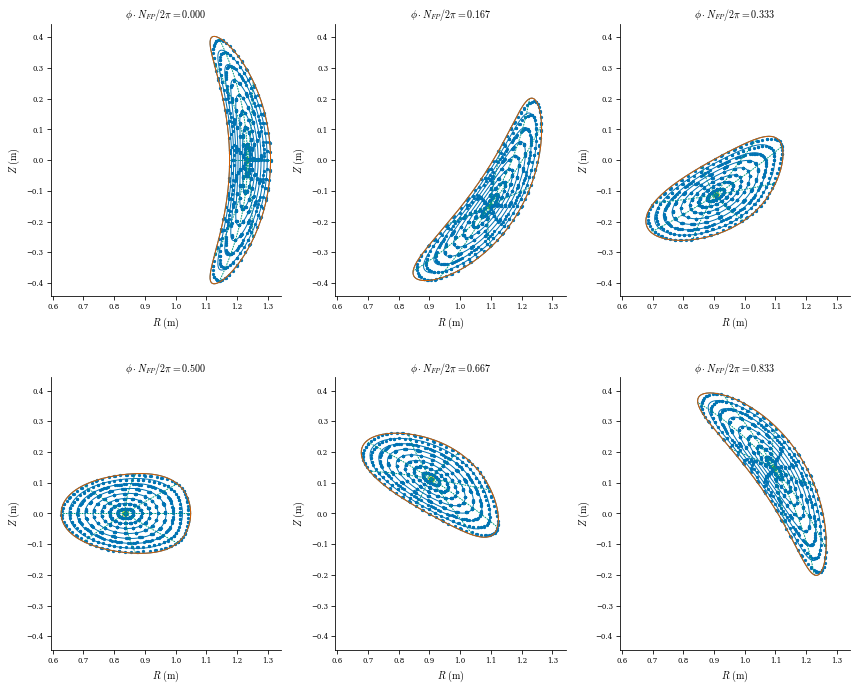

In [9]:
plot_field_lines(optimized_coilset, eq);

## Finite Beta

Now let's get a finite beta stellarator, we'll use a W7-X example which has $\beta=2\%$

In [10]:
eq = desc.examples.get("W7-X")

### Make Initial Coilset

Again we will initialize with circular coils centered on the equilibrium axis, and with their normal oriented along the axis tangent vector.


In [11]:
minor_radius = eq.compute("a")["a"]
offset = 1.25 * minor_radius
num_coils = 3  # coils per half field period per coilset

zeta = np.linspace(0, np.pi / eq.NFP, num_coils, endpoint=False) + np.pi / (
    2 * eq.NFP * num_coils
)
grid = LinearGrid(rho=[0.0], M=0, zeta=zeta, NFP=eq.NFP)
data_center = eq.axis.compute("x", grid=grid, basis="rpz")
data_normal = eq.axis.compute("x_s", grid=grid, basis="rpz")

centers = data_center["x"]
normals = data_normal["x_s"]

modular_coils = []
# make the modular FourierXYZCoil coilset
for k in range(num_coils):
    coil = FourierPlanarCoil(
        current=-1e6,
        center=centers[k, :],
        normal=normals[k, :],
        r_n=[0, minor_radius + offset, 0],
        basis="rpz",  # we are giving the center and normal in cylindrical
    ).to_FourierXYZ(
        N=6
    )  # fit with 6 fourier coefficients per coil
    modular_coils.append(coil)

modular_coilset = CoilSet(modular_coils, NFP=int(eq.NFP), sym=eq.sym)

To this we'll also add some planar windowpane coils. We'll have windowpane coils on both the inboard and outboard side, but only 1 on each side per half-period

In [12]:
k = 1  # only make windowpanes at 1 toroidal location in the half field period

windowpane_coils = []
# make the planar windowpane coilset
outboard_center = centers[k, :] + np.array([2, 0, 0])
coil = FourierPlanarCoil(
    current=-1e6,
    center=outboard_center,
    normal=np.cross(normals[k, :], np.array([0, 0, 1])),
    r_n=[0, minor_radius, 0],
    basis="rpz",  # we are giving the center and normal in cylindrical
)
coil.change_resolution(N=2)
windowpane_coils.append(coil)

inboard_center = centers[k, :] + np.array([-2, 0, 0])

coil = FourierPlanarCoil(
    current=-1e6,
    center=inboard_center,
    normal=-np.cross(normals[k, :], np.array([0, 0, 1])),
    r_n=[0, minor_radius, 0],
    basis="rpz",  # we are giving the center and normal in cylindrical
)
coil.change_resolution(N=2)
windowpane_coils.append(coil)

windowpane_coilset = CoilSet(windowpane_coils, NFP=int(eq.NFP), sym=eq.sym)

Next we'll combine the modular and windowpane coils into a single `MixedCoilSet`. This will allow us to optimize both at the same time.

In [13]:
coilset = MixedCoilSet(windowpane_coilset, modular_coilset)

# visualize the initial coilset
plot_grid = LinearGrid(M=40,N=80,NFP=1,endpoint=True) # a smaller than usual plot grid to reduce memory of the notebok file

fig = plot_3d(eq, "|B|",grid=plot_grid)
fig = plot_coils(coilset, fig=fig)
fig.show()

### Optimizing a `MixedCoilSet` with different types of coils

In [14]:
# We'll use the same grid for all the coils. Alternatively, we could use separate grids
# for the windowpane and modular coils.
coil_grid = LinearGrid(N=50)
# we won't define any plasma grid, but instead use the default grid provided by the objective which is usually sufficient

obj = ObjectiveFunction(
    (
        QuadraticFlux(
            eq,
            field=coilset,
            field_grid=coil_grid,
            vacuum=False,
            weight=200,
        ),
        CoilSetMinDistance(
            coilset,
            bounds=(0.2, np.inf),
            weight=100,
            grid=coil_grid,
        ),
        CoilLength(
            coilset,
            bounds=(0, 3 * np.pi * (minor_radius + offset)),
            normalize_target=False,
            grid=coil_grid,
        ),
        CoilCurvature(coilset, bounds=(0, 2), weight=100, grid=coil_grid),
    )
)

# Because the plasma component of the normal field is nonzero, we don't need
# any additional constraints to avoid the trivial solution, but we will include
# constraints to fix the center position of the windowpane coils
constraints = (FixParameters(coilset, params=[{"center": True}, {}]),)

optimizer = Optimizer("lsq-exact")

(optimized_coilset2,), _ = optimizer.optimize(
    coilset,
    objective=obj,
    constraints=constraints,
    maxiter=50,
    verbose=3,
    copy=True,
)

Building objective: Quadratic flux
Precomputing transforms
Timer: Precomputing transforms = 2.25 sec
Building objective: coil-coil minimum distance
Building objective: coil length
Precomputing transforms
Timer: Precomputing transforms = 5.35 ms
Building objective: coil curvature
Precomputing transforms
Timer: Precomputing transforms = 6.10 ms
Timer: Objective build = 2.96 sec
Building objective: Fixed parameters
Building objective: fixed shift
Building objective: fixed rotation
Timer: Objective build = 43.9 ms
Timer: Linear constraint projection build = 1.81 sec
Number of parameters: 138
Number of objectives: 1649
Starting optimization
Using method: lsq-exact
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          1.071e+05                                    1.651e+05   
       1              5          9.904e+04      8.053e+03      2.262e+04      1.528e+05   
       2              6          8.466e+04      1.438e+04  

In [15]:
normalized_field = compute_average_normalized_field(optimized_coilset2, eq)
print(f"<Bn> = {normalized_field:.3e}")

<Bn> = 2.437e-02


In [16]:
# visualize the optimized coilset and the normal field error
fig = plot_3d(eq, "B*n", field=optimized_coilset2, field_grid=coil_grid,grid=plot_grid)
fig = plot_coils(optimized_coilset2, fig=fig)
fig.show()

In [17]:
# currents in windowpane coils
optimized_coilset2.coils[0].current

[-478317.729980607, -329390.68339856784]

In [18]:
# currents in modular coils
optimized_coilset2.coils[1].current

[-96624.44507517837, -108329.39611212398, -100498.60880290295]